# Spatial Pathway Analysis and Pathway Score Spatial Clustering

In this tutorial we:
- process a metaspace dataset for Spatial Class Analysis (SPA)
- Run SCA using Kernel PCA
- investigate biological structures using the SCA pathway scores and Moran's i structural clustering

The ICL A30 Adenocarcinoma metaspace dataset (https://metaspace2020.org/dataset/2016-10-01_12h10m16s) is used in this tutorial


In [1]:
#import modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sspa
from collections import defaultdict
from metaspace import SMInstance
from scipy.cluster.hierarchy import linkage, fcluster, dendrogram
import src.spca.__init__ as spca

/Users/kuuttivaananen/Desktop/Ebbels/venv/lib/python3.9/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


## Loading dataset

In [2]:
# load dataset 
sm = SMInstance()
colorectal_ad_dsid = "2016-10-01_12h10m16s"
ds = sm.dataset(id=colorectal_ad_dsid)
results = ds.results(database=("ChEBI", "2016"))

- here we filter the metaspace dataset annotations by False Discovery Rate (FDR). 

In [3]:
# Filter results by FDR 
results_filt = results[results["fdr"]<= 0.2]
# create mol_formula column to filter pixel intensities by presence of chebi matches
results_filt["mol_formula"] = results_filt.index.map(lambda x: f"{x[0]}{x[1][1:]}")

results_filt

/var/folders/r_/3f54jbw50qxfg21m_gk0c9xh0000gn/T/ipykernel_18160/3909118596.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  results_filt["mol_formula"] = results_filt.index.map(lambda x: f"{x[0]}{x[1][1:]}")


,,ionFormula,ion,mz,msm,rhoSpatial,rhoSpectral,moc,fdr,offSample,isotopeImages,colocCoeff,moleculeNames,moleculeIds,intensity,mol_formula
formula,adduct,,,,,,,,,,,,,,,
C18H34O2,-H,C18H33O2,C18H34O2-H-,281.248604,0.984025,0.987732,0.997546,0.998699,0.05,False,"[{'mz': 281.2485253910554, 'url': 'https://s3....",None,"[ethyl palmitoleate, vaccenic acid, oleic acid...","[CHEBI:84934, CHEBI:36023, CHEBI:16196, CHEBI:...",45720.996094,C18H34O2H
C16H32O2,-H,C16H31O2,C16H32O2-H-,255.232954,0.981322,0.984713,0.997486,0.999068,0.05,False,"[{'mz': 255.23287532705822, 'url': 'https://s3...",None,"[4,8,12-trimethyltridecanoic acid, 14-methylpe...","[CHEBI:58966, CHEBI:84890, CHEBI:15756, CHEBI:...",22740.777344,C16H32O2H
C42H80NO10P,-H,C42H79NO10P,C42H80NO10P-H-,788.544708,0.972404,0.980547,0.993484,0.998201,0.05,False,"[{'mz': 788.5446293230552, 'url': 'https://s3....",None,[1-oleoyl-2-stearoyl-sn-glycero-3-phospho-L-se...,"[CHEBI:75103, CHEBI:79096]",4272.436035,C42H80NO10PH
C18H36O2,-H,C18H35O2,C18H36O2-H-,283.264254,0.970332,0.974088,0.997077,0.999064,0.05,False,"[{'mz': 283.26417545505535, 'url': 'https://s3...",None,"[ethyl hexadecanoate, 16-methylheptadecanoic a...","[CHEBI:84932, CHEBI:84896, CHEBI:85218, CHEBI:...",15875.057617,C18H36O2H
C48H83NO10P,-H,C48H82NO10P,C48H83NO10P-H-,863.568183,0.965107,0.980849,0.987304,0.996603,0.05,False,"[{'mz': 863.5681044190555, 'url': 'https://s3....",None,[phosphatidylserine 42:5(1-)],[CHEBI:72090],2977.485352,C48H83NO10PH
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C13H30BrN,-H,C13H29NBr,C13H30BrN-H-,278.148887,0.005866,0.008446,0.705181,0.984891,0.20,False,"[{'mz': 278.14880793305537, 'url': 'https://s3...",None,[decyltrimethylammonium bromide],[CHEBI:295756],76.570778,C13H30BrNH
C27H43O4,-H,C27H42O4,C27H43O4-H-,430.308858,0.005862,0.007180,0.876228,0.931818,0.20,False,"[{'mz': 430.30877991905544, 'url': 'https://s3...",None,"[(25R)-3beta,4beta-dihydroxycholest-5-en-26-oa...",[CHEBI:86116],99.551361,C27H43O4H
C15H28O,-H,C15H27O,C15H28O-H-,223.206739,0.005819,0.006137,0.953337,0.994710,0.20,True,"[{'mz': 223.20666057905817, 'url': 'https://s3...",None,[trans-13-methyltetradec-2-enal],[CHEBI:70995],49.793556,C15H28OH


## Download image sets

- Download the pixel intensities using the Metaspace API
- we process the pixel intensities to make a dataframe which can be segmented and which contains the ChEBI ids associated with each annotation

In [4]:
# saving pixel intensities 
isotope_image_sets = ds.all_annotation_images(fdr=0.2, only_first_isotope=True, scale_intensity=False)

100%|████████████████████████████████████████| 670/670 [00:03<00:00, 209.62it/s]


In [5]:
# process image set
pixel_intensities = spca.process_image_set(isotope_image_sets, results_filt)


In [6]:
print("average number of chebis per annotation:",results_filt["moleculeIds"].apply(len).mean())

average number of chebis per annotation: 3.5324324324324325


In [7]:
# with ChEBI annotations, remove "CHEBI:" prefix (not necessary if HMDB -> ChEBI id conversion has been done)
pixel_intensities["chebi"] = pixel_intensities["chebi"].apply(
    lambda lst: [s[6:] for s in lst] if isinstance(lst, list) else lst
)
pixel_intensities

,chebi,y0_x0,y0_x1,y0_x2,y0_x3,y0_x4,y0_x5,y0_x6,y0_x7,y0_x8,...,y93_x84,y93_x85,y93_x86,y93_x87,y93_x88,y93_x89,y93_x90,y93_x91,y93_x92,y93_x93
mol_formula,,,,,,,,,,,,,,,,,,,,,
C18H34O2H,"[84934, 36023, 16196, 50572, 28194, 29735, 360...",0.000000,0.000000,0.000000,0.000000,0.003922,0.003922,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
C16H32O2H,"[58966, 84890, 15756, 50626, 84849]",0.062745,0.078431,0.070588,0.086275,0.086275,0.094118,0.082353,0.086275,0.086275,...,0.011765,0.011765,0.015686,0.015686,0.011765,0.015686,0.011765,0.011765,0.011765,0.011765
C42H80NO10PH,"[75103, 79096]",0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.003922,0.000000,0.000000,0.003922,0.000000,0.000000,0.000000,0.000000,0.000000
C18H36O2H,"[84932, 84896, 85218, 28842, 65084]",0.109804,0.121569,0.113725,0.149020,0.149020,0.168627,0.145098,0.125490,0.137255,...,0.011765,0.019608,0.023529,0.015686,0.019608,0.019608,0.015686,0.019608,0.019608,0.019608
C20H32O2H,"[1182, 71488, 2451, 67830, 36039, 36306, 36302...",0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C14H28OH,"[84067, 78633]",0.000000,0.466667,0.000000,0.000000,0.000000,0.607843,0.505882,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
C17H20O5H,"[2850, 85673, 69337, 2723, 6478, 70350, 67426,...",0.737255,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
C27H43O4H,[86116],0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


- We create a dictionary with molecular formulas as the keys and its associated ChEBIs as the values. This allows mapping the features to pathways using the ChEBI ids. 

In [8]:
# one-to-many pathway mapping 
# creating dict with formula:all chebis
formula_chebis = dict(zip(pixel_intensities.index, pixel_intensities['chebi']))
# drop keys with na values
formula_chebis = {k: v for k, v in formula_chebis.items() if v not in [np.nan, 'nan']}

## DBScan segmentation
- Here we segment the dataset to only include "on-sample" pixels.
- We segment on the summed FDR-filtered features using DBScan, However alternative inputs can be used such as Principal components (PCs), log ratios of PC loadings e.g. Log(top _n_ PC1 loadings / bottom _n_ PC1 loadings) so long as they are numpy arrays of shape (x,y)
- After DBSCan, we fix some spots and use the clustering mask to discard non-sample pixels

In [9]:
# summing all on-sample intensities together and visualizing
pixel_intensities_test = pixel_intensities.iloc[:, 1:]
pixel_intensities_test = pixel_intensities_test.T
pixel_intensities_test["sum"] = pixel_intensities_test.sum(axis = 1)
filt_tic = pixel_intensities_test["sum"]
# convert flattened pixel positions into 2d matrix
tic_matrix = spca.img_conversion(filt_tic)


Text(0.5, 1.0, 'Filtered TIC')

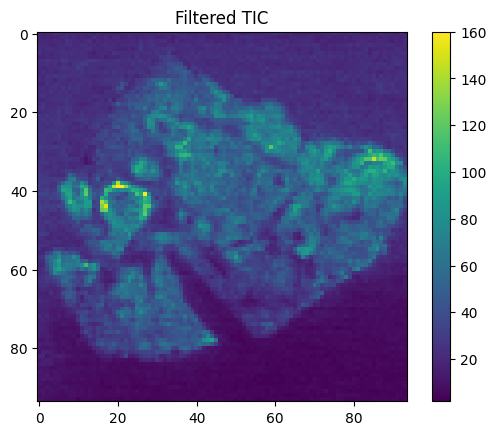

In [10]:
# visualize
plt.imshow(
    tic_matrix,
    cmap='viridis',
    # interpolation='nearest'
)
plt.colorbar(orientation = "vertical")
plt.title("Filtered TIC")


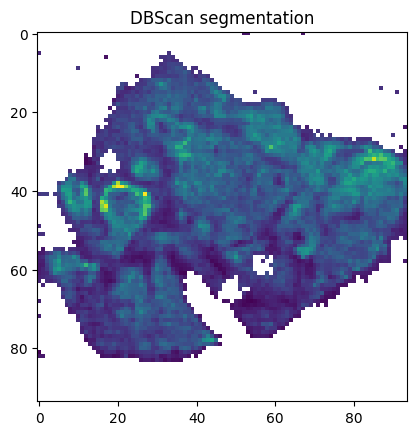

In [11]:
tic_np = tic_matrix.fillna(0).to_numpy()
segmented_array = spca.DBScan_array(tic_np, 0.033, 20)

In [12]:
# convert the matrix into a map
tissue_map = np.where(~np.isnan(segmented_array), 1, np.nan)
tissue_map

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])

### Spot Cleaning
- cleaning up spots missed by DBScan

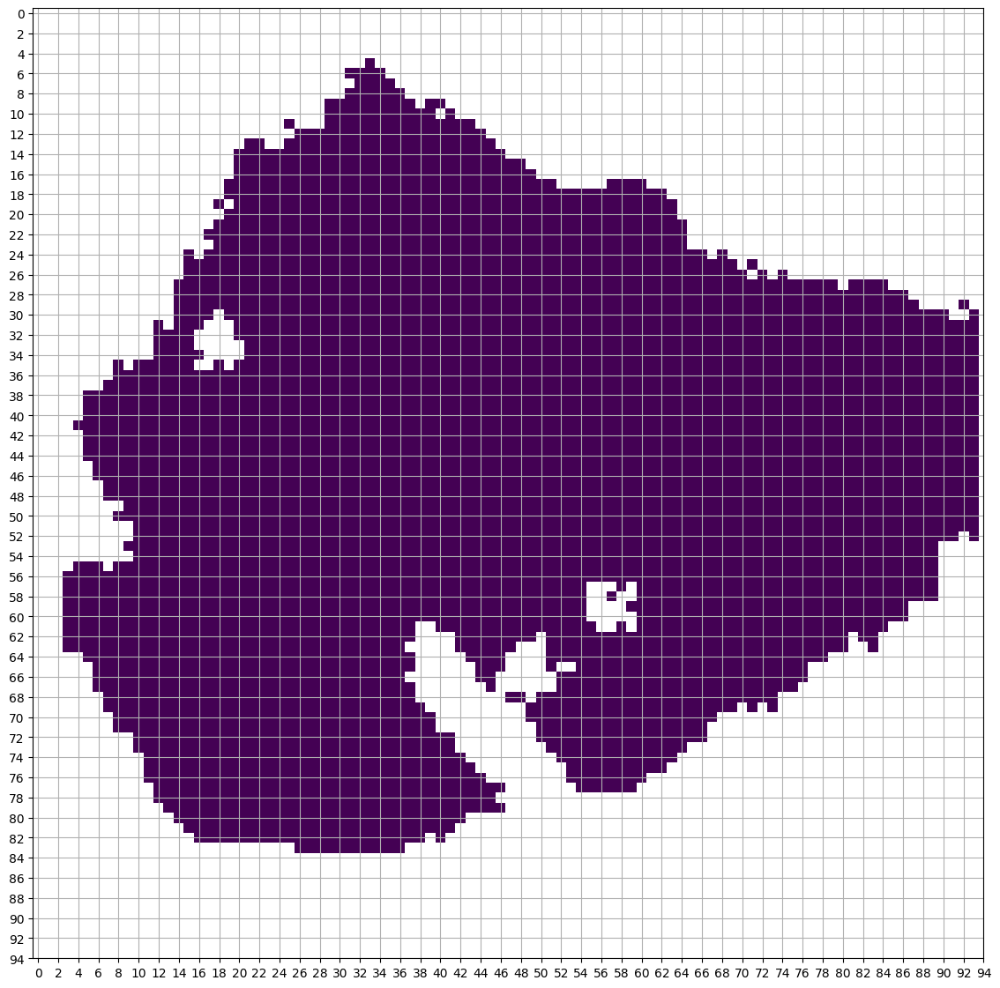

In [13]:
# clean up spots

off_sample_spots = [[0,53],[0,52], [0,67],
                    [5,0],
                    [6,17],
                    [9,10],
                    [14,87],
                    [15,55], [15,91],
                    [24,93], 
                    [26,90],
                    [41,0], [41,1], [41,2],
                    [49,0],
                    [51,0],[51,1],
                    [55,1],
                    [56,0],[56,1],[56,2],
                    [57,0],[57,1],[57,2],
                    [58,0],[58,1],[58,2],[58,93],
                    [59,0],[59,1],[59,2],
                    [60,0],[60,1],[60,2],
                    [61,0],[61,1],[61,2],
                    [62,0],[62,1],[62,2],
                    [63,0],[63,1],[63,2],
                    [64,1],
                    [68,0],
                    [72,0],
                    [81,0],
                    [82,0],[82,1]]

for spot in off_sample_spots:
    tissue_map[spot[0],spot[1]] = np.nan

plt.figure(figsize=(14,14))
plt.imshow(tissue_map, )
plt.yticks(range(0,96,2))
plt.xticks(range(0,96,2))
plt.grid()

### Tissue mask processing

In [14]:
# convert map into df to drop all non_sample pixels.
coord = []
value = []
for y, row in enumerate(tissue_map):
    for x, val in enumerate(row):
        string = f"y{y}_x{x}"
        coord.append(string)
        value.append(val)


mask_df = pd.DataFrame(value, index=coord, columns=["Mask"])

### SPCA processing
- After getting a tissue mask to identify "On-Sample" pixels, we can complete the processing of the pixel intensities for running spatial pathway analysis.
- The final processing includes dropping ChEBI ids from the pixel intensities dataframe, log normalization, and dropping non-sample pixels.

In [15]:
spca_pixel_intensities = spca.SPCA_processing(pixel_intensities, mask_df)
spca_pixel_intensities

mol_formula,C18H34O2H,C16H32O2H,C42H80NO10PH,C18H36O2H,C20H32O2H,C20H38O2H,C43H81O13PH,C18H34O3H,C41H80NO8PH,C18H36O3H,...,C16H26O4H,C11H16O4H,C14H24OH,C42H78NO7PH,C16H12O6H,C14H28OH,C17H20O5H,C27H43O4H,C15H28OH,C10H16Br2N2O2H
y5_x33,0.087796,0.124588,0.185556,0.145198,0.134930,0.028014,0.011271,0.093109,0.119389,0.033553,...,0.000000,0.000000,0.000000,0.000000,0.0,0.743739,0.0,0.0,0.371969,0.0
y6_x31,0.066342,0.119389,0.160465,0.140073,0.108934,0.022455,0.016874,0.103679,0.129768,0.033553,...,0.295665,0.556393,0.000000,0.000000,0.0,0.579294,0.0,0.0,0.397964,0.0
y6_x32,0.060929,0.098404,0.215100,0.119389,0.087796,0.016874,0.011271,0.098404,0.087796,0.028014,...,0.000000,0.286417,0.469171,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0
y6_x33,0.087796,0.119389,0.318530,0.145198,0.190522,0.028014,0.016874,0.108934,0.134930,0.033553,...,0.000000,0.513441,0.000000,0.272433,0.0,0.517399,0.0,0.0,0.564067,0.0
y6_x34,0.055495,0.082462,0.234465,0.108934,0.150305,0.011271,0.011271,0.071736,0.134930,0.028014,...,0.244051,0.000000,0.481380,0.000000,0.0,0.000000,0.0,0.0,0.354375,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
y83_x32,0.155394,0.165518,0.087796,0.190522,0.098404,0.093109,0.005647,0.145198,0.098404,0.155394,...,0.000000,0.000000,0.397964,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0
y83_x33,0.180572,0.205319,0.087796,0.234465,0.108934,0.077109,0.011271,0.185556,0.055495,0.267741,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0
y83_x34,0.140073,0.170553,0.108934,0.195471,0.077109,0.071736,0.011271,0.150305,0.087796,0.224815,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0
y83_x35,0.119389,0.134930,0.093109,0.175572,0.050041,0.077109,0.005647,0.098404,0.066342,0.077109,...,0.000000,0.300267,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0


### Creating Chemical classes
- in order to create chemical classes, we fetch the parent molecules for the filtered annotations using the bioservices ChEBI API. 

- The parent molecules are used as the Chemical classes. This leads to some variability in the specificity of the classes (e.g. dipeptide and "6-alkyl-4-hydroxy-2H-pyran-2-one" are classes). 

- Even with a stricter threshold of at least five mappings per class, about 50% of all annotations still map to a chemical class. This shows that chemical class analysis captures far more annotations and features than SPA.

In [16]:
# extract df of just chebi ids [[chebi1,cheb2],[chebi3...]]
query_ids = pixel_intensities["chebi"].map(lambda ids: [f"CHEBI:{id}" for id in ids])
# using the API, get chebi parent molecules and chebis
parent_info = query_ids.map(
    lambda id_list: [spca.chebi_parent(chebi_id) for chebi_id in id_list] 
    )

# separate names and ChEBI ids
parent_chebis = parent_info.map(lambda lst: [x[0] if x else None for x in lst])
parent_names = parent_info.map(lambda lst: [x[1] if x else None for x in lst])
parent_chebis


mol_formula
C18H34O2H         [CHEBI:13209, None, None, CHEBI:50573, None, C...
C16H32O2H              [CHEBI:15904, None, None, None, CHEBI:13209]
C42H80NO10PH                                    [CHEBI:11750, None]
C18H36O2H         [CHEBI:25835, CHEBI:39417, CHEBI:39417, None, ...
C20H32O2H         [CHEBI:23849, CHEBI:36033, CHEBI:23849, None, ...
                                        ...                        
C14H28OH                                        [None, CHEBI:17135]
C17H20O5H         [CHEBI:37667, None, CHEBI:47622, CHEBI:37667, ...
C27H43O4H                                                    [None]
C15H28OH                                              [CHEBI:61870]
C10H16Br2N2O2H                                       [CHEBI:140326]
Name: chebi, Length: 470, dtype: object

In [17]:
# make formula parent dict
formula_parents = dict(zip(spca_pixel_intensities.columns,parent_names))
# this needs to be reverse so each key is a parent mol and the values are formulas
parent_formula = defaultdict(list)

for key, values in formula_parents.items():
    for val in values:
        parent_formula[val].append(key)

parent_formula = dict(parent_formula)


<class 'dict'>


In [18]:
# make list of unique parents
uni_parents = [ii for i in parent_names.tolist() for ii in i]
uni_parents = [x for x in uni_parents if x is not None]
uni_parents = list(set(uni_parents))

## Running SPCA:
- Here we run Spatial Class analysis using rbf kernel Principal Component Analysis (kPCA). We could also run it with z-score.

- For each class (parent molecule), we map features to them using the parent formula dict. If more than 5 features are mapped to a class, the mapped features undergo dimensionality reduction by kPCA to produce a class score for each pixel. 


In [19]:
sca_kPCA = spca.sca_KPCA(uni_parents, parent_formula, 5)
sca_res_df = sca_kPCA.fit_transform(spca_pixel_intensities)

parent class 6-alkyl-4-hydroxy-2H-pyran-2-one SCA complete with 5 metabs
parent class C20 dihydroceramide SCA complete with 5 metabs
parent class long-chain fatty acid SCA complete with 24 metabs
parent class fatty acid methyl ester SCA complete with 9 metabs
parent class 3-oxo-5alpha-steroid SCA complete with 7 metabs
parent class 1,2-diacyl-sn-glycero-3-phosphoethanolamine SCA complete with 24 metabs
parent class cholanoid SCA complete with 7 metabs
parent class 1,2-diacyl-sn-glycerol 3-phosphate SCA complete with 8 metabs
parent class bile acid SCA complete with 6 metabs
parent class octadecatrienoic acid SCA complete with 6 metabs
parent class germacrane sesquiterpenoid SCA complete with 8 metabs
parent class long-chain fatty acid ethyl ester SCA complete with 18 metabs
parent class 2-pyranones SCA complete with 7 metabs
parent class retinoid SCA complete with 5 metabs
parent class phenols SCA complete with 5 metabs
parent class hydroxy fatty acid SCA complete with 7 metabs
parent 

### Analysis of Class scores

- following SCA, we analyse the class scores by looking the variability in scores and looking at the most spatially clustered scores (using Moran's i)


In [20]:
# compute pathway variance
class_var = sca_res_df.var(axis=0)
class_var = class_var.sort_values(ascending=False)
class_var

sesquiterpenoid                           15.283233
diterpenoid                               12.555130
icosatetraenoic acid                      12.002618
long-chain fatty acid                     10.256954
long-chain fatty acid ethyl ester          9.808430
                                            ...    
steroid aldehyde                           1.438282
epoxide                                    1.420483
acetate ester                              1.409563
alkyl,acyl-sn-glycero-3-phosphocholine     1.352945
phenols                                    1.204734
Length: 74, dtype: float64

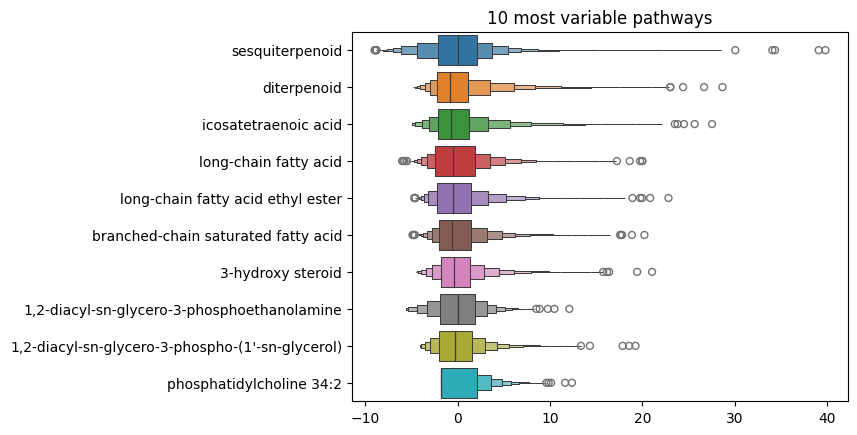

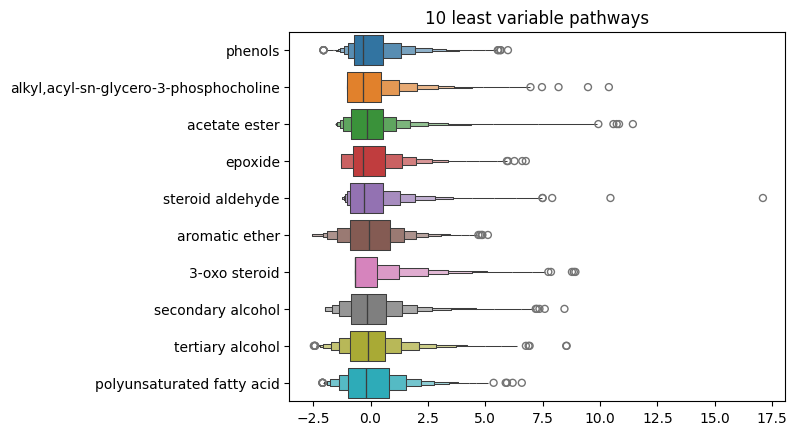

In [21]:
# plot distribution for top 10 most variable pathways   # 
top_pathways = class_var.index[:10]
sns.boxenplot(
    data=sca_res_df[top_pathways],
    orient='h'
)
plt.title("10 most variable pathways")
plt.show()
# plot distribution for top 10 least variable pathways
lowestvar_pathways = class_var.sort_values(ascending=True).index[:10]
sns.boxenplot(
    data=sca_res_df[lowestvar_pathways],

    orient='h'
)
plt.title("10 least variable pathways")
plt.show()

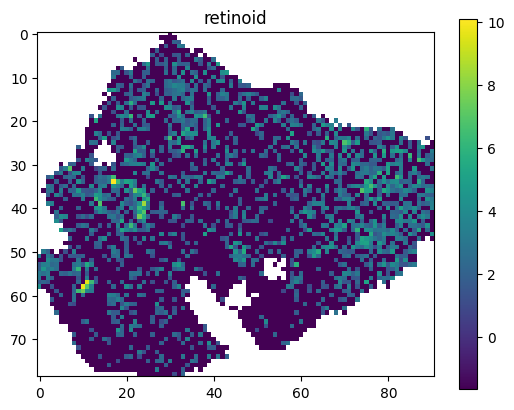

In [22]:
# select a pathway and visualize its pathway scores

pathway_vis = "retinoid"

# show the intensity of a pathway score on the image
sspa_res_df_selected = pd.DataFrame(sca_res_df[pathway_vis])
selected_matrix = spca.img_conversion(sspa_res_df_selected)
# visualize
plt.imshow(
    selected_matrix,
    cmap='viridis',
)
plt.colorbar(orientation = "vertical")
plt.title(pathway_vis)
plt.show()

### Moran's i 
- Another metric to understand individual class score distribution is Moran's i. Moran's i measures the level of spatial clustering for the scores (i.e. wether high scores and low scores cluster together).

- A high moran's i indicates high scores and low scores localize together in clusters and a low moran's i indicates there is not much colocalization. for example a score of 0 would mean high and low scores have a chequerboard pattern

- The Moran's i is caluclated through a Gaussian weight matrix and the finetuning of the epsilon value (controls width) is important for the spatial scale of the dataset and the biological structures of interest


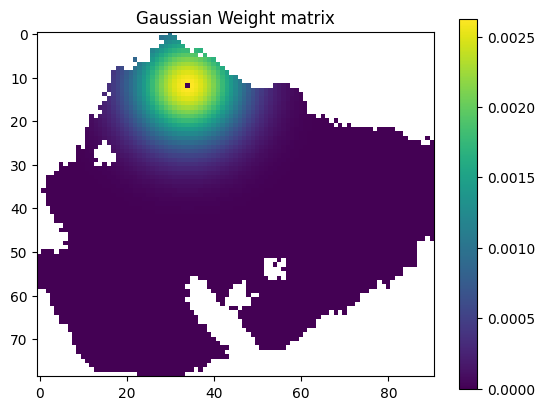

In [23]:
moran_is = spca.gaussian_moran(sca_res_df, 9, 0.001, visualize=True)

Text(0.5, 1.0, 'Moran values for all Pathways')

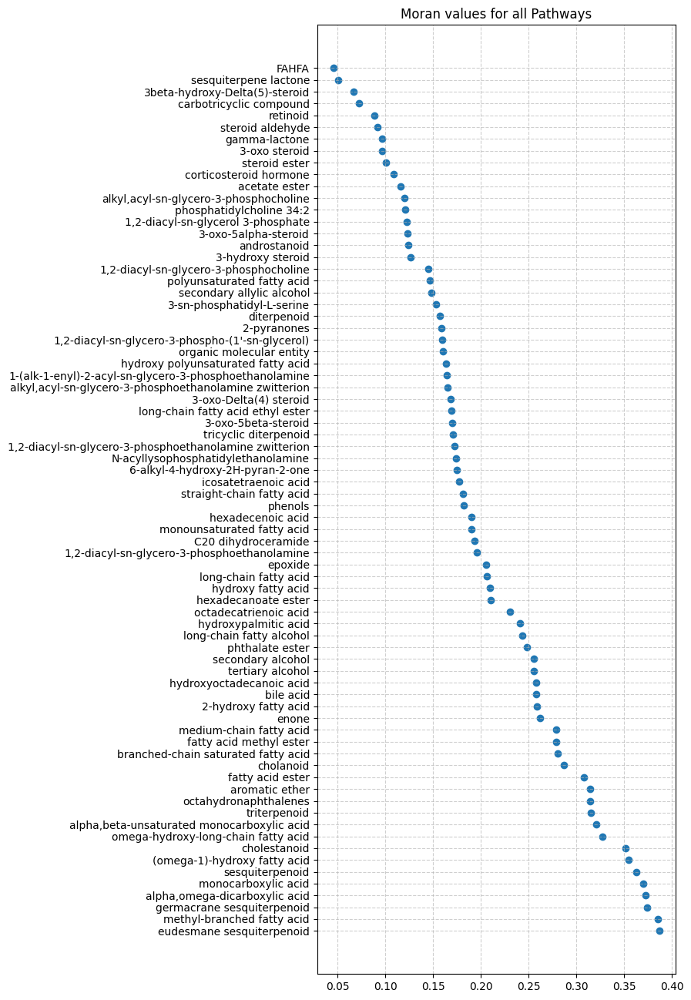

In [24]:
# Sort by spatial distinctiveness
most_spatially_distinct = sorted(moran_is.items(), key=lambda x: x[1], reverse=True)

# visualize moran results:
labels, scores = zip(*most_spatially_distinct)
plt.figure(figsize=(6,16))
plt.scatter(scores, labels)
plt.grid(True, linestyle="--", alpha=0.6)
plt.title("Moran values for all Pathways")

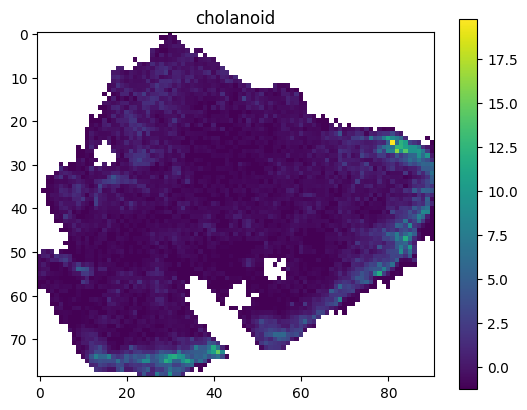

In [25]:
# select a pathway and visualize its pathway scores
pathway_vis = "cholanoid"

# show the intensity of a pathway score on the image
sspa_res_df_selected = pd.DataFrame(sca_res_df[pathway_vis])
selected_matrix = spca.img_conversion(sspa_res_df_selected)
# visualize
plt.imshow(
    selected_matrix,
    cmap='viridis',
)
plt.colorbar(orientation = "vertical")
plt.title(pathway_vis)
plt.show()